Extract consensus sequence patterns from stage 1 models

In [ ]:
import numpy as np
from copy import deepcopy

import torch

from torch import nn
from torch.autograd import grad
from torch_fftconv import fft_conv1d, FFTConv1d

class SimpleNet(nn.Module):
    def __init__(self):

        super(SimpleNet, self).__init__()
        self.conv = nn.Conv1d(4,  40, kernel_size=51, padding=25)
        self.conv_inr = nn.Conv1d(4,  10, kernel_size=15, padding=7)
        self.activation = nn.Sigmoid()
        
        self.deconv = FFTConv1d(80,  10, kernel_size=601, padding=300)
        self.deconv_inr = nn.ConvTranspose1d(20,  10, kernel_size=15, padding=7)
        self.softplus = nn.Softplus()

    def forward(self, x):
        y = torch.cat([self.conv(x), self.conv(x.flip([1,2])).flip([2])], 1)
        y_inr = self.conv_inr(x)
        yact = self.activation(y)
        y_inr_act = self.activation(y_inr)
        y_pred = self.softplus(self.deconv(yact*y)+self.deconv_inr(y_inr_act*y_inr))
        return y_pred
    
import glob
nets = []
filenames = []
for i in range(12):
    f = './models/stage1_40000_'+str(i)+'.pth'
    net = SimpleNet()
    net.load_state_dict(torch.load(f))
    net.cpu()
    nets.append(net)
    filenames.append(f)
         

In [ ]:
mats = [nets[i].conv.weight.detach().numpy() for i in range(len(nets))]
mats_norm = [mat - mat.mean(axis=1, keepdims=True) for mat in mats]
demats = [nets[i].deconv.weight.detach().numpy() for i in range(len(nets))]

In [ ]:
from scipy.stats import pearsonr
from scipy.signal import correlate2d
from matplotlib import pyplot as plt
%matplotlib inline

from numba import njit
import random

@njit( )
def cross_corr(x, y):
    cors = []
    i=0
    for j in range(y.shape[1]-5):
        minlen = np.fmin(x.shape[1]-i, y.shape[1]-j)
        cors.append(np.fmax(np.corrcoef(x.flatten(), 
                                 np.concatenate((y[:,j:],y[:,:j]), axis=1).flatten())[0,1],
                           np.corrcoef(x.flatten(), 
                                 np.concatenate((y[:,j:],y[:,:j]), axis=1)[::-1,::-1].flatten())[0,1]))
    return np.array(cors)

def comparemats(mats):
    crossmats = {}
    validmats = {}
    for ii in range(len(mats)):
        for jj in range(ii+1, len(mats)):
            cors = []
            for i in range(40):
                cors_row = []
                for j in range(40):
                    cors_row.append(cross_corr(mats_norm[ii][i], mats_norm[jj][j]).max())
                cors.append(cors_row)
            cors = np.array(cors)
            crossmats[(ii,jj)]=cors
            validmats[(ii,jj)]= (np.abs(mats_norm[ii]).max(axis=2).max(axis=1)[:,None]>0.1) & (np.abs(mats_norm[jj]).max(axis=2).max(axis=1)[None,:]>0.1)

    return crossmats, validmats

In [ ]:
 crossmats, validmats = comparemats(mats)

In [ ]:
matchlist = []
matchscores = []
for i in range(len(nets)):
    for j in range(i+1,len(nets)):
        mat = crossmats[(i,j)].copy()
        mat[mat < mat.max(axis=1,keepdims=True)] = 0
        mat[mat < mat.max(axis=0,keepdims=True)] = 0
        mat[~validmats[(i,j)]] = 0
        matchlist.append(np.argwhere(mat>0.95).astype(str)+np.array(["_"+str(i), "_"+str(j)],dtype=np.object)[None,:])
        matchscores.append(mat[mat>0.95])


/home2/s190483/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


In [ ]:
import seaborn as sns
sns.set(rc={"figure.dpi":300, 'savefig.dpi':300})
sns.set_style("white")

import logomaker
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd
%matplotlib inline
prop_cycle = plt.rcParams['axes.prop_cycle']
itercolor =  prop_cycle()
def plotfun(motifpwm, title=None, ax=None):
    motifpwm = pd.DataFrame(motifpwm,columns=['A','C','G','T'])
    crp_logo = logomaker.Logo(motifpwm,
                              shade_below=.5,
                              fade_below=.5,
                              font_name='Arial Rounded MT Bold',
                             ax=ax)

    # style using Logo methods
    crp_logo.style_spines(visible=False)
    crp_logo.style_spines(spines=['left', 'bottom'], visible=True)
    crp_logo.style_xticks(rotation=90, fmt='%d', anchor=0)
    if title is not None:
        crp_logo.ax.set_title(title)
    # style using Axes methods
    crp_logo.ax.set_ylabel("", labelpad=-1)
    crp_logo.ax.xaxis.set_ticks_position('none')
    crp_logo.ax.xaxis.set_tick_params(pad=-1)
    return crp_logo



In [ ]:
import networkx as nx
from collections import defaultdict
g = nx.Graph()
g.add_weighted_edges_from(np.hstack([np.concatenate(matchlist, axis=0),np.concatenate(matchscores)[:,None]]))


findfont: Font family ['Arial Rounded MT Bold'] not found. Falling back to DejaVu Sans.
/home2/s190483/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:14: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


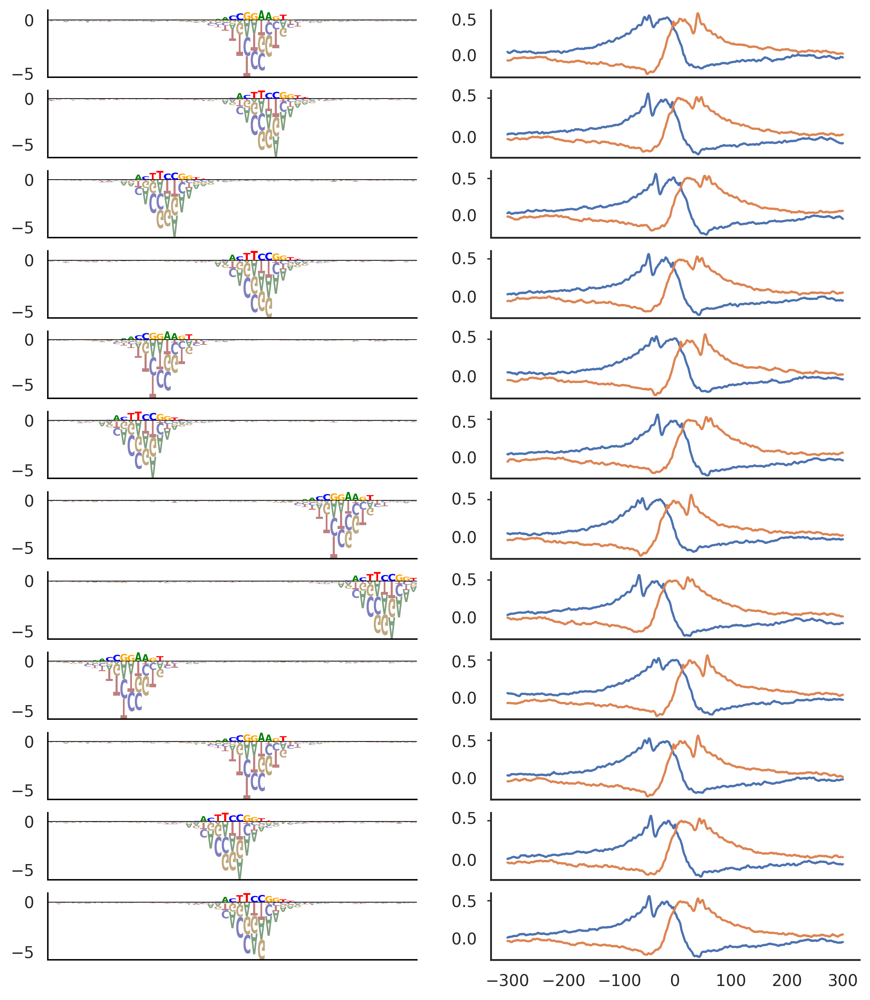

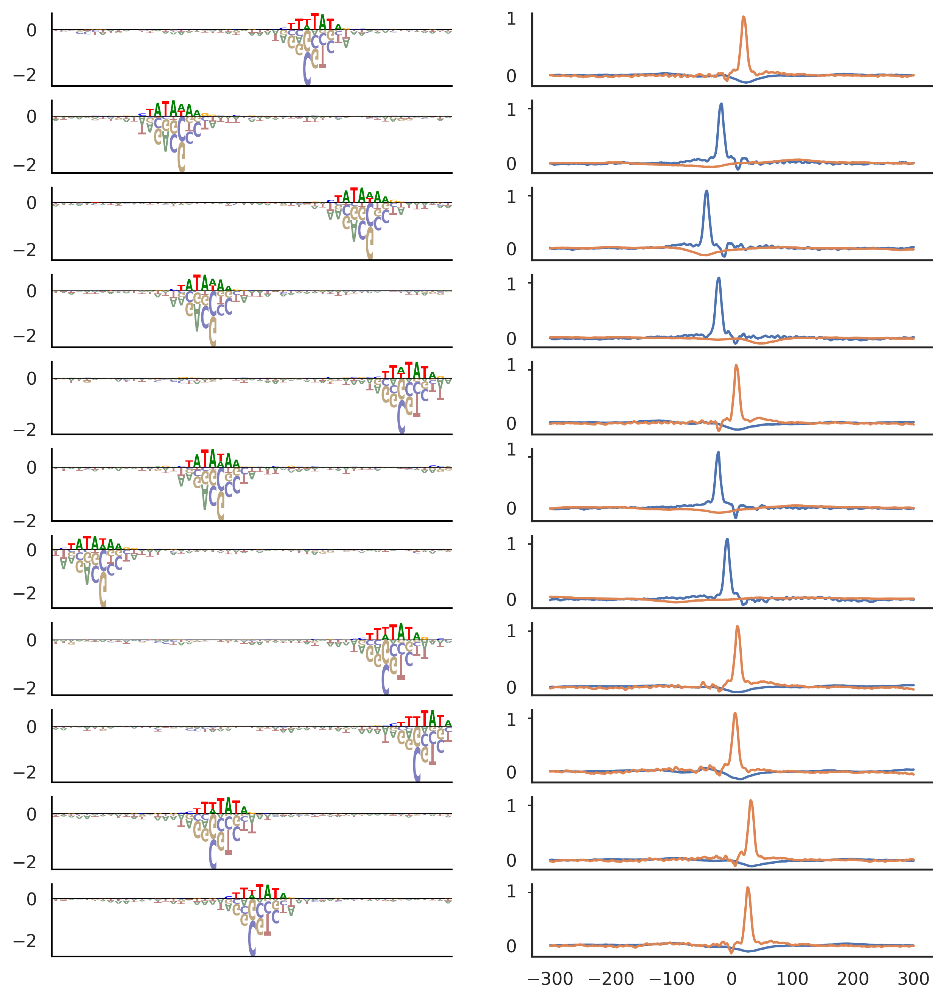

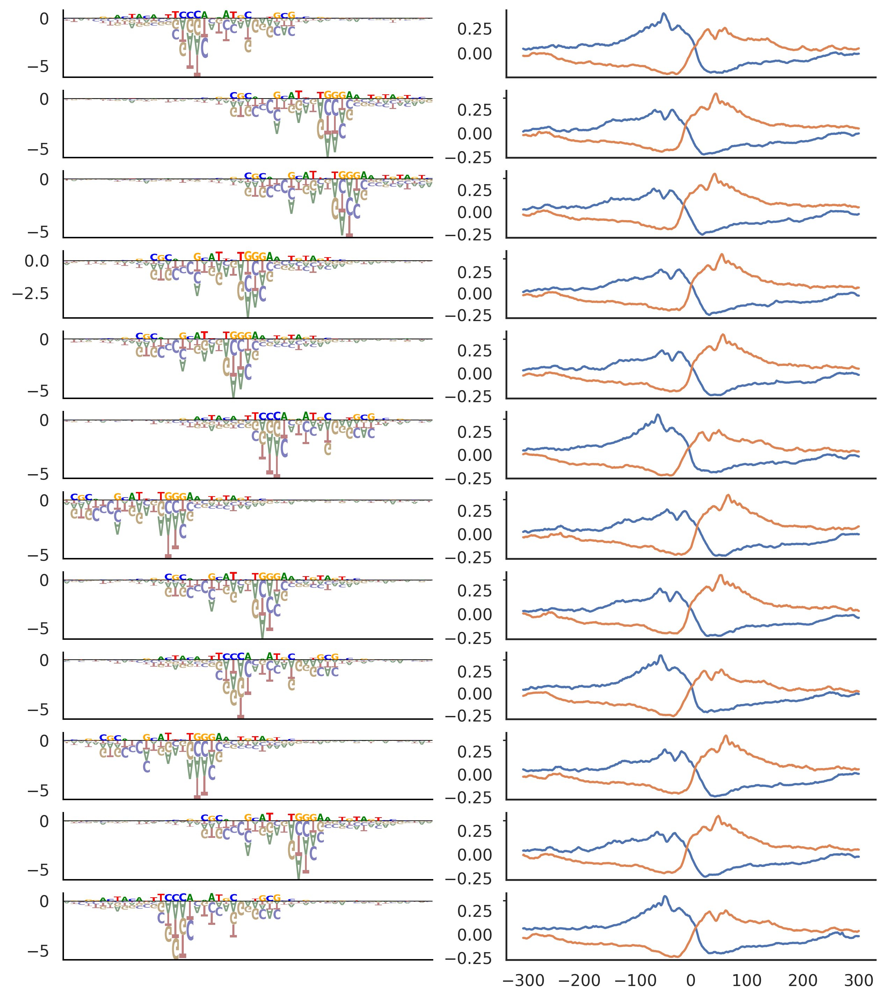

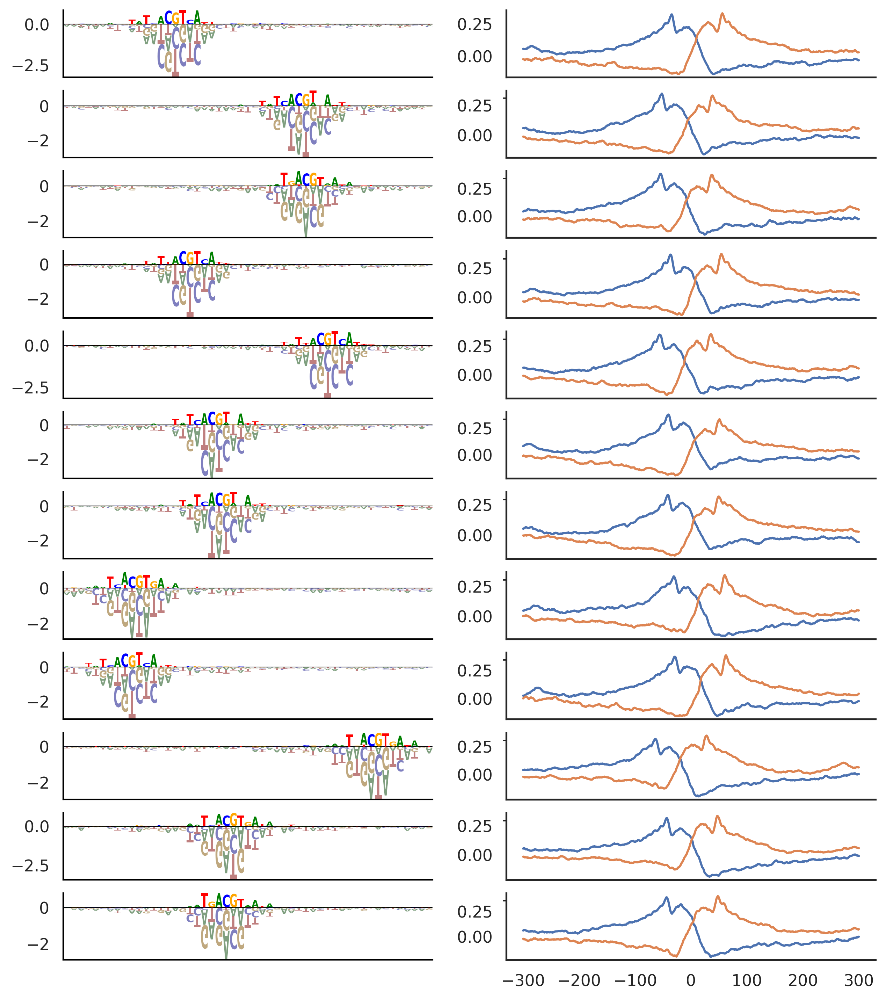

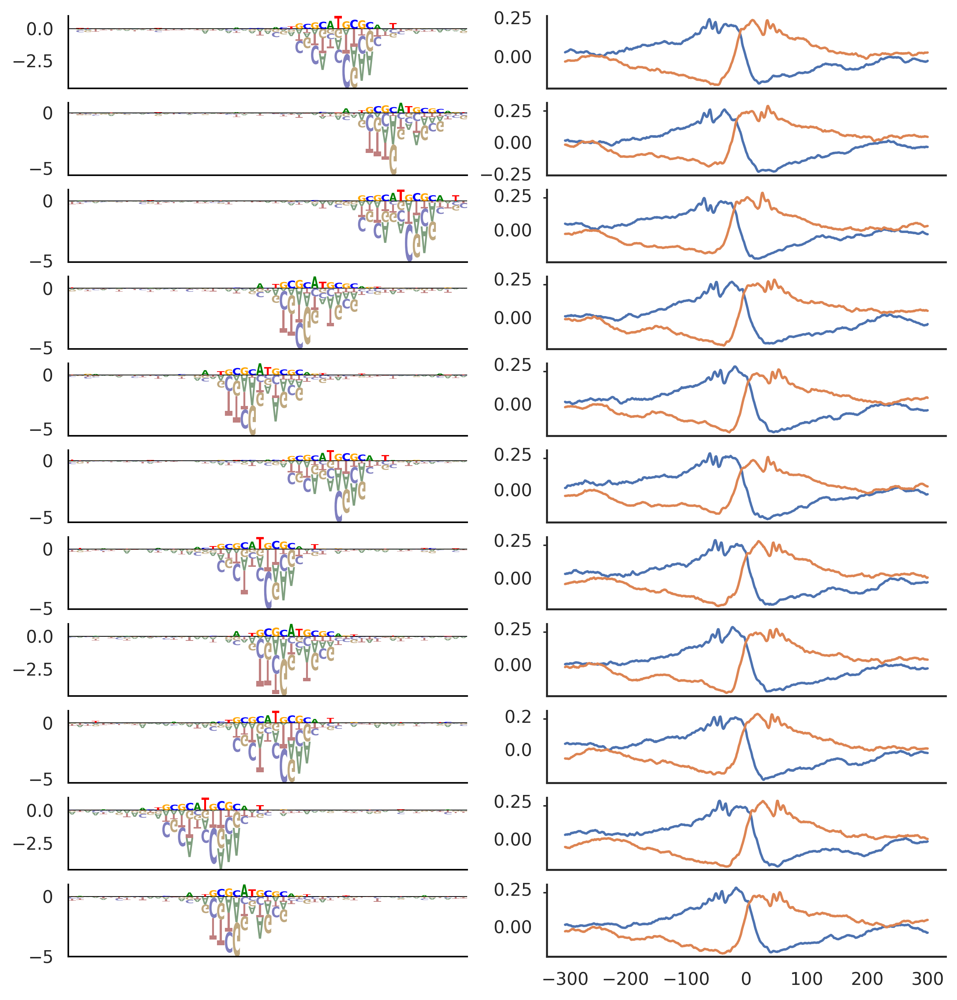

...

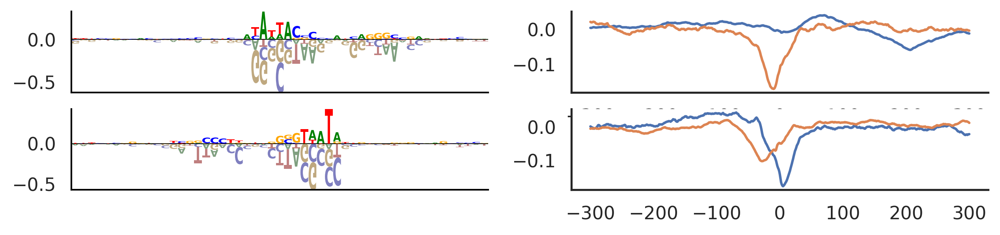

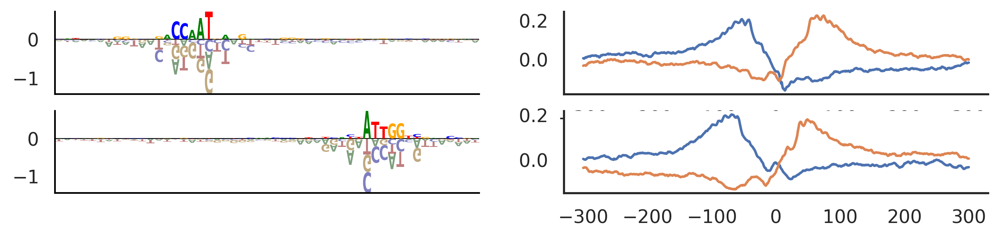

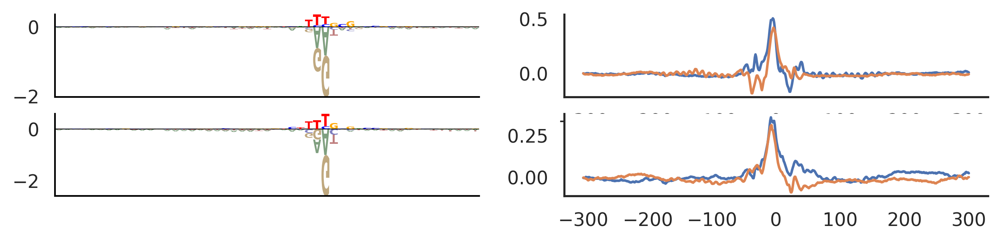

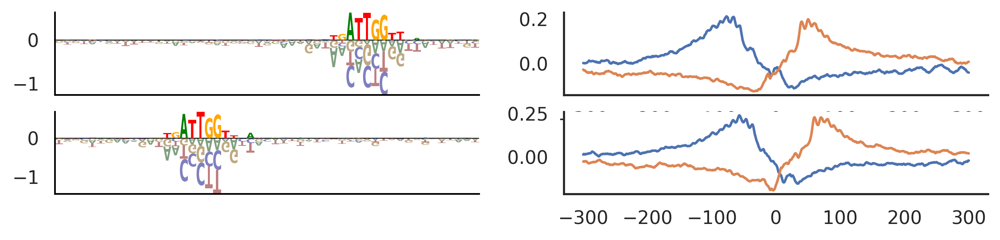

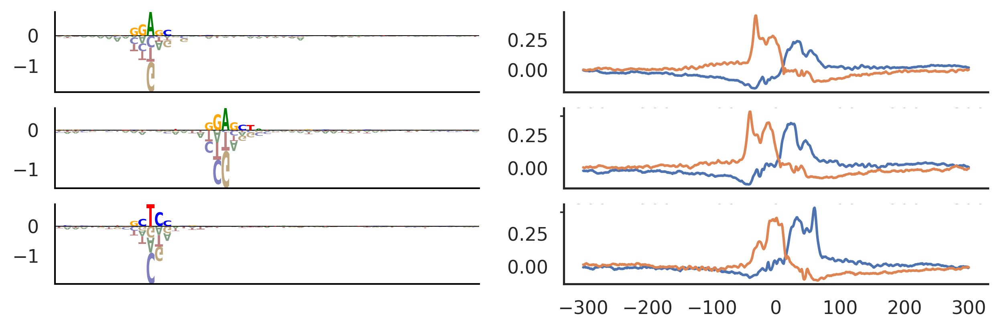

In [ ]:
from matplotlib.backends.backend_pdf import PdfPages
bestmats = []
bestscores = []
filescores = defaultdict(list)
with PdfPages('../figures/motif_replicates.pdf') as pdf:

    for cc in list(nx.connected_components(g)):
        bestscore = 0
        matinds = []
        motifinds = []
        scores = []

        _, axes = plt.subplots( figsize=(10,len(cc)*1), nrows=len(cc),ncols=2, dpi=300)
        for i in cc:
            motifind, matind = list(map(int, i.split('_')))
            score = np.sum([crossmats[i,matind][:,motifind].max() if i < matind else crossmats[matind,i][motifind,:].max() for i in np.setdiff1d(range(4),[matind])  ])

            if score > bestscore:
                bestmat = mats[matind][motifind]

            matinds.append(matind)
            motifinds.append(motifind)
            scores.append(score)

            filescores[filenames[matind]].append(score)

        for ii, i in enumerate(np.argsort(-np.array(scores))):
            plotfun(mats[matinds[i]][motifinds[i]].T, ax=axes[ii][0])
            axes[ii][0].set_xticks([])
            axes[ii][1].plot(np.arange(-300,301), demats[matinds[i]][0,motifinds[i]])
            axes[ii][1].plot(np.arange(-300,301), demats[matinds[i]][0,40+motifinds[i],::-1])
            sns.despine()
        pdf.savefig()
        bestscores.append(bestscores)
        bestmats.append(bestmat)



In [ ]:
selectmats = []
selectdemats = []
selectdemats_rc = []

for cc in list(nx.connected_components(g)):
    if len(cc)>=7:
        for i in cc:
            motifind, matind = list(map(int, i.split('_')))

            if matind == 7:
                selectmats.append(mats[matind][motifind])
                selectdemats.append(demats[matind][:,[motifind],:])
                selectdemats_rc.append(demats[matind][:,[motifind+40],:])


In [ ]:
len(selectmats)

13

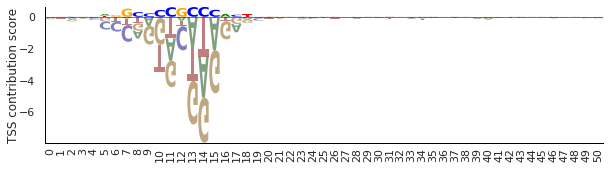

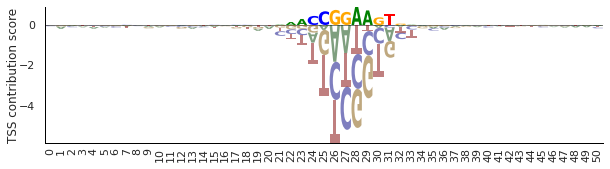

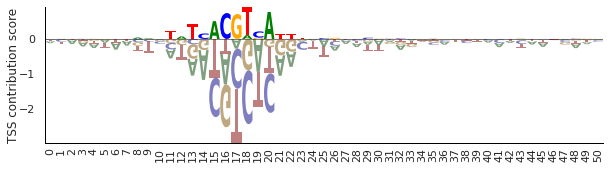

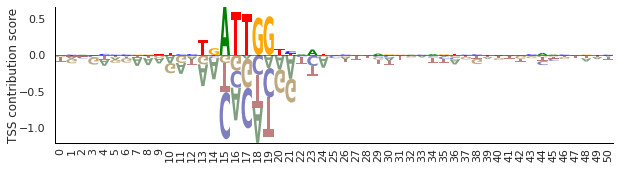

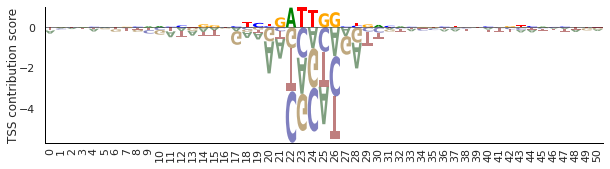

...

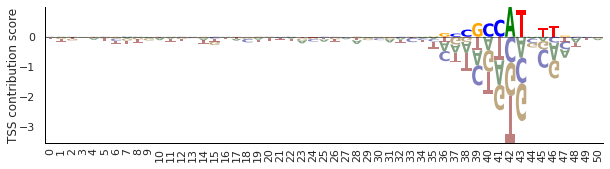

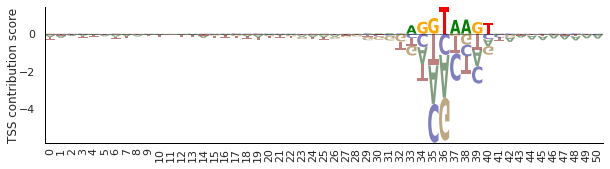

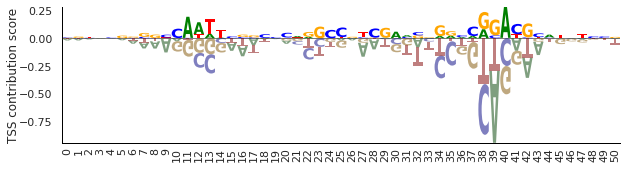

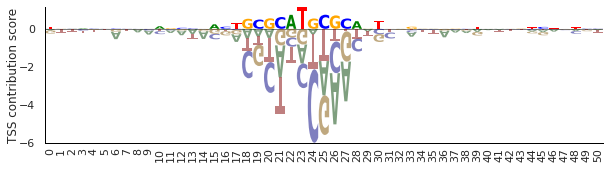

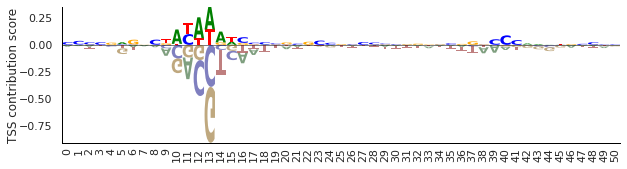

In [ ]:
for mat in selectmats:
    plotfun(mat.T)

In [ ]:
np.save(arr=np.stack(selectmats)[np.array([0, 1, 2, 4, 8, 9, 10, 11, 5, 6]),:], 
        file='./stage1_40000_7.selectmotifs0.95.10motifs.conv.npy')
np.save(arr=np.concatenate([np.concatenate(selectdemats, axis=1)[:,np.array([0, 1, 2, 4, 8, 9, 10, 11, 5, 6]),:],
                np.concatenate(selectdemats_rc, axis=1)[:,np.array([0, 1, 2, 4, 8, 9, 10, 11, 5, 6]),:]], axis=1),
        file='./stage1_40000_7.selectmotifs0.95.10motifs.deconv.npy')


In [ ]:
mats = [nets[i].conv_inr.weight.detach().numpy() for i in range(len(nets))]
mats_norm = [mat - mat.mean(axis=1, keepdims=True) for mat in mats]
demats = [nets[i].deconv_inr.weight.detach().numpy() for i in range(len(nets))]

In [ ]:
from scipy.signal import correlate2d
from matplotlib import pyplot as plt
%matplotlib inline
crossmats = {}
validmats = {}
for ii in range(len(mats)):
    for jj in range(ii+1, len(mats)):
        cors = []
        for i in range(10):
            cors_row = []
            for j in range(10):
                cors_row.append(cross_corr(mats_norm[ii][i], mats_norm[jj][j]).max())
            cors.append(cors_row)
        cors = np.array(cors)
        crossmats[(ii,jj)]=cors
        validmats[(ii,jj)]= (np.abs(mats_norm[ii]).max(axis=2).max(axis=1)[:,None]>0.1) & (np.abs(mats_norm[jj]).max(axis=2).max(axis=1)[None,:]>0.1)
        

In [ ]:
matchlist = []
matchscores = []
for i in range(len(nets)):
    for j in range(i+1,len(nets)):
        mat = crossmats[(i,j)].copy()
        mat[mat < mat.max(axis=1,keepdims=True)] = 0
        mat[mat < mat.max(axis=0,keepdims=True)] = 0
        mat[~validmats[(i,j)]] = 0
        matchlist.append(np.argwhere(mat>0.95).astype(str)+np.array(["_"+str(i), "_"+str(j)],dtype=np.object)[None,:])
        matchscores.append(mat[mat>0.95])


/home2/s190483/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:9: DeprecationWarning: `np.object` is a deprecated alias for the builtin `object`. To silence this warning, use `object` by itself. Doing this will not modify any behavior and is safe. 
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  if __name__ == '__main__':


{'2_3', '8_1', '5_10', '4_11', '4_5', '1_0'}


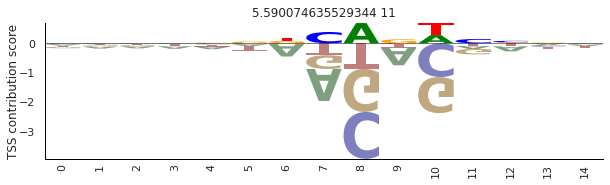

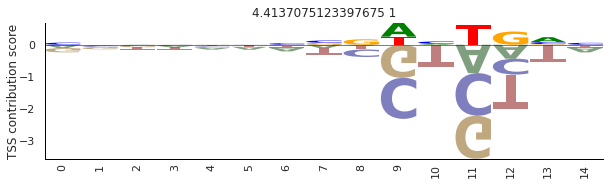

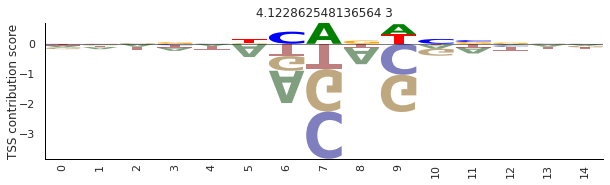

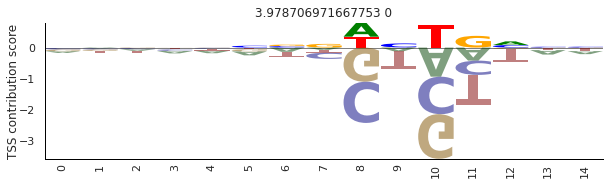

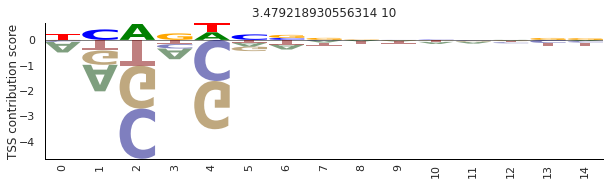

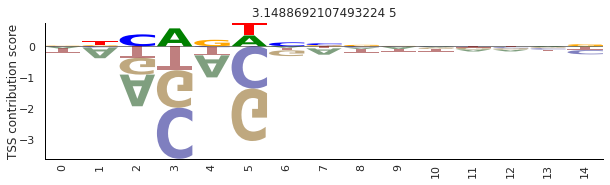

{'7_5', '5_11', '7_1', '3_0', '4_2', '3_6'}


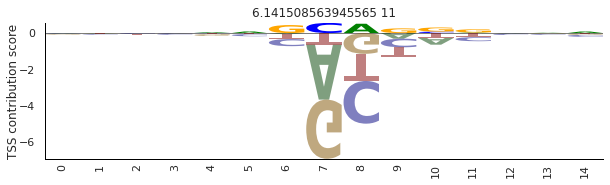

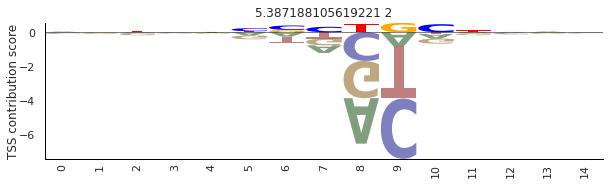

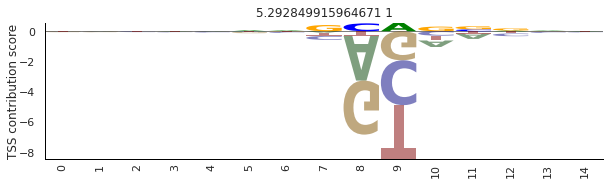

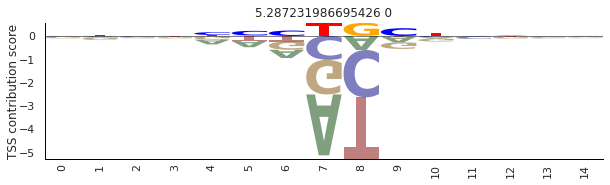

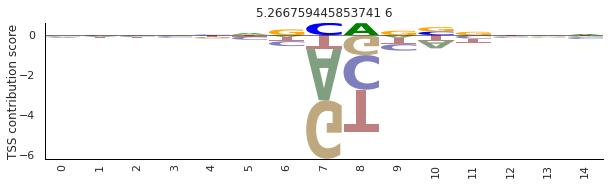

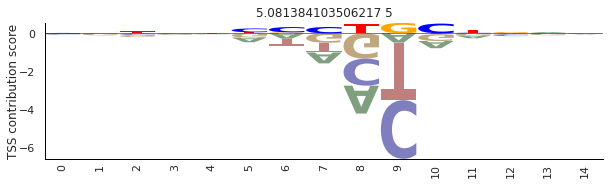

{'3_11', '1_1', '5_5', '5_0'}


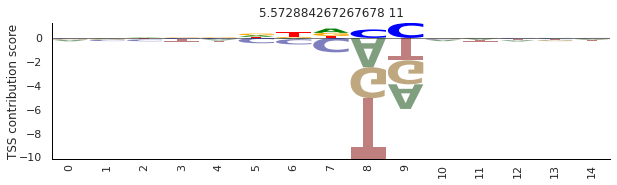

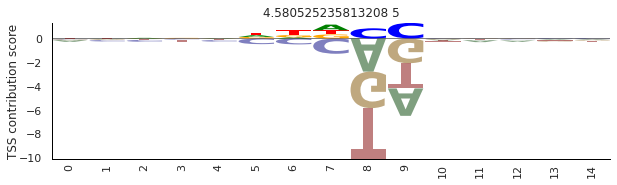

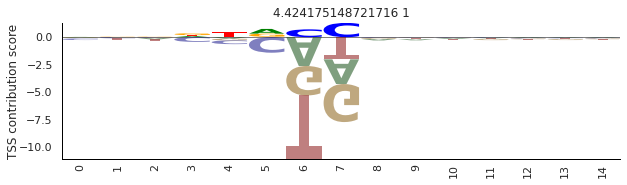

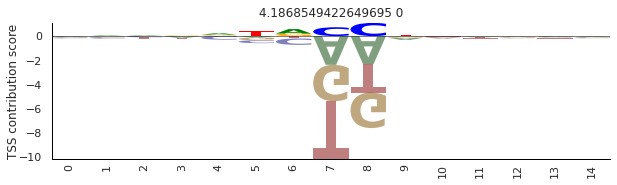

{'8_11', '7_2', '3_1'}


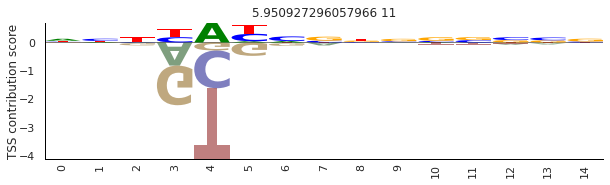

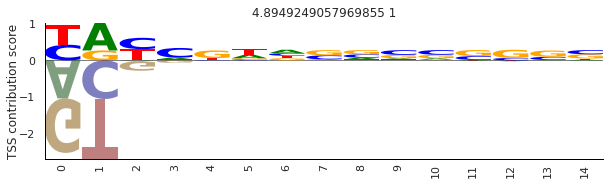

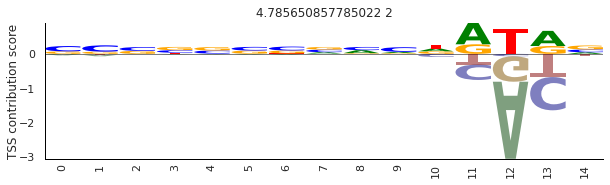

{'5_9', '7_7', '1_2'}


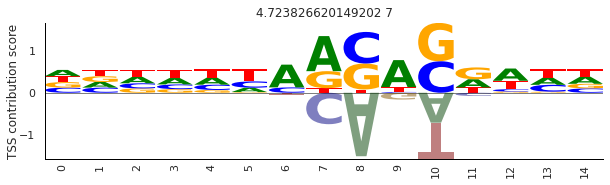

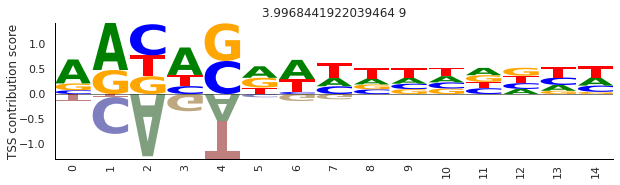

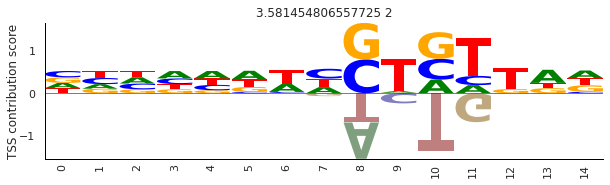

{'2_9', '2_7', '2_2'}


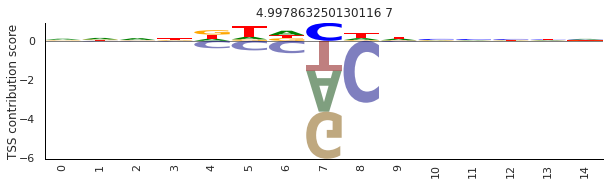

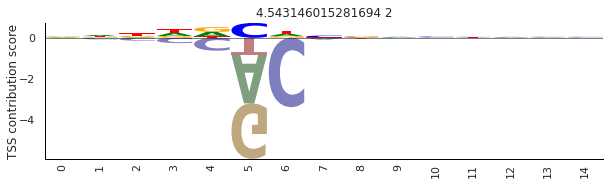

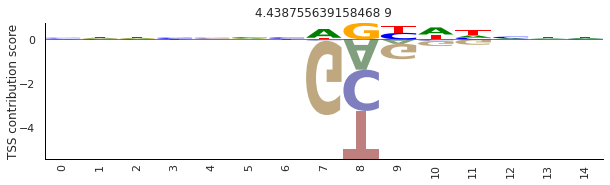

{'9_3', '6_8'}


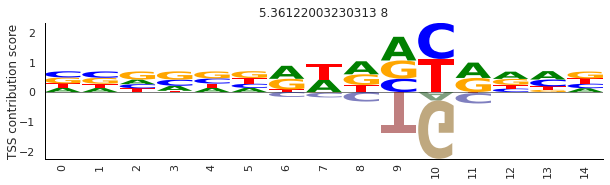

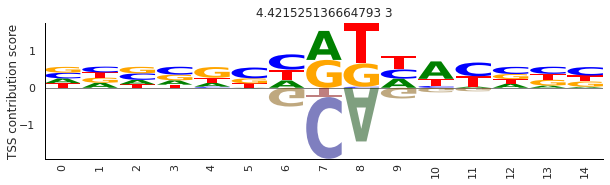

{'6_6', '9_8'}


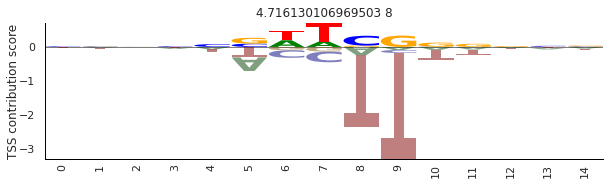

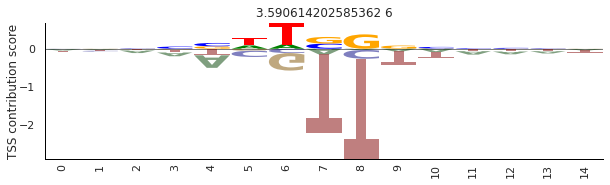

{'7_8', '2_10'}


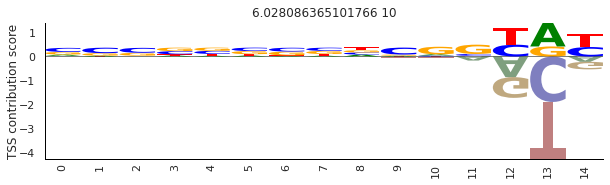

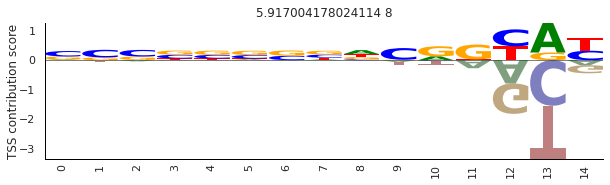

In [ ]:
import networkx as nx
from collections import defaultdict
g = nx.Graph()
g.add_weighted_edges_from(np.hstack([np.concatenate(matchlist, axis=0),np.concatenate(matchscores)[:,None]]))

bestmats = []
bestdemats = []
bestdemats_rc = []
bestscores = []
for cc in list(nx.connected_components(g)):
    print(cc)
    bestscore = 0
    matinds = []
    motifinds = []
    scores = []
    for i in cc:
        motifind, matind = list(map(int, i.split('_')))
        score = np.sum([crossmats[i,matind][:,motifind].max() if i < matind else crossmats[matind,i][motifind,:].max() for i in np.setdiff1d(range(7),[matind])  ]
)
        if score > bestscore:
            bestmat = mats[matind][motifind]
            bestdemat = demats[matind][[motifind],:,:]
            bestdemat_rc = demats[matind][[motifind+10],:,:]
            bestscore = score
        matinds.append(matind)
        motifinds.append(motifind)
        scores.append(score)


    for i in np.argsort(-np.array(scores)):
        plotfun(mats[matinds[i]][motifinds[i]].T, title=str(scores[i])+' '+ str(matinds[i]))
        plt.show()
    bestscores.append(bestscores)
    bestmats.append(bestmat)
    bestdemats.append(bestdemat)
    bestdemats_rc.append(bestdemat_rc)



In [ ]:
np.save(arr=np.stack(bestmats)[[0,1,2]], file='./stage1_40000.selectinrs0.95.3inrf.npy')
np.save(arr=np.concatenate([np.concatenate(bestdemats, axis=0)[[0,1,2],:,:],
                            np.concatenate(bestdemats_rc, axis=0)[[0,1,2],:,:]], axis=0), file='stage1_40000.selectinrs0.95.3inrf.deconv.npy')


In [ ]:
bestmats = np.load( file='stage1_40000.selectinrs0.95.3inrf.npy')

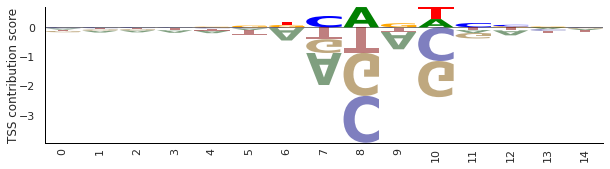

In [ ]:
plotfun(bestmats[0].T)

Center and trim stage 2 model sequence patterns

In [ ]:
import numpy as np
from copy import deepcopy

import torch

from torch import nn
from torch.autograd import grad
from torch_fftconv import fft_conv1d, FFTConv1d

class SimpleNet(nn.Module):
    def __init__(self):
        super(SimpleNet, self).__init__()
        self.conv = nn.Conv1d(4,  n_motifs, kernel_size=51, padding=25)
        self.conv_inr = nn.Conv1d(4,  10, kernel_size=15, padding=7)
        self.conv_sim = nn.Conv1d(4,  32, kernel_size=3, padding=1)

        self.activation = nn.ReLU()

        self.deconv = FFTConv1d(n_motifs*2,  10, kernel_size=601, padding=300)
        self.deconv_inr = nn.ConvTranspose1d(20,  10, kernel_size=15, padding=7)
        self.deconv_sim = FFTConv1d(64,  10, kernel_size=601, padding=300)

        self.sigmoid = nn.Sigmoid()
        self.softplus = nn.Softplus()
        self.scaler = nn.Parameter(torch.ones(1))
        self.scaler2 = nn.Parameter(torch.ones(1))

    def forward(self, x, withscaler=True):
        y = torch.cat([self.conv(x), self.conv(x.flip([1,2])).flip([2])], 1)
        y_inr = torch.cat([self.conv_inr(x), self.conv_inr(x.flip([1,2])).flip([2])], 1)
        y_sim = torch.cat([self.conv_sim(x), self.conv_sim(x.flip([1,2])).flip([2])], 1)

        if withscaler:
            yact = self.softplus(y*self.scaler**2)
            y_inr_act = self.softplus(y_inr)
            y_sim_act = self.softplus(y_sim*self.scaler2**2)#*y_sim
        else:
            yact = self.softplus(y)
            y_inr_act = self.softplus(y_inr)
            y_sim_act = self.softplus(y_sim)#*y_sim

        y_pred = self.softplus(self.deconv(yact)+self.deconv_inr(y_inr_act)+self.deconv_sim(y_sim_act))
        return y_pred
    
n_motifs=10
net = SimpleNet()
net.load_state_dict(torch.load('stage2_40000_3.pth'))


<All keys matched successfully>

In [ ]:
mats = net.conv.weight.detach().numpy()
demats = net.deconv.weight.detach().numpy()

In [ ]:
selectmats = []
selectdemats = []
selectdemats_rc = []

for i in range(len(mats)):
    selectmats.append(mats[i])
    selectdemats.append(demats[:,[i],:])
    selectdemats_rc.append(demats[:,[i+10],:])


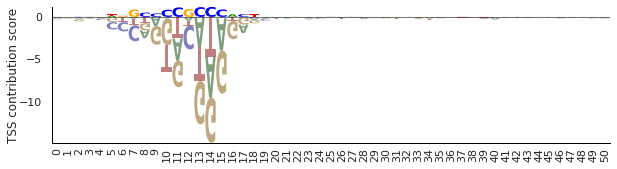

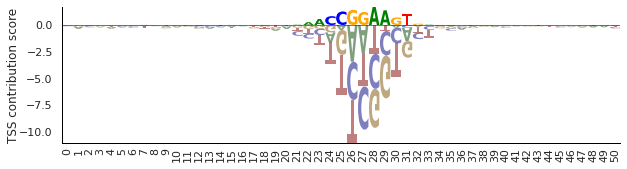

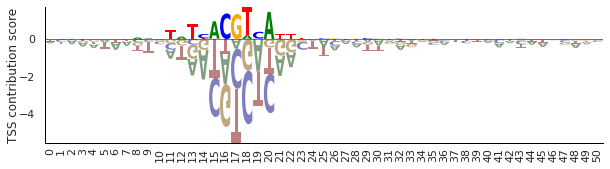

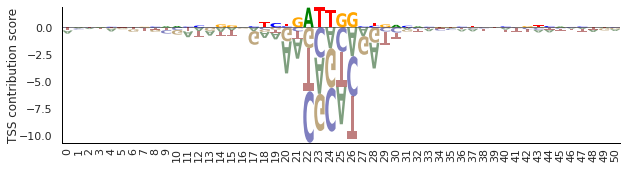

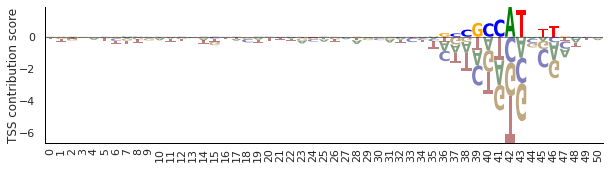

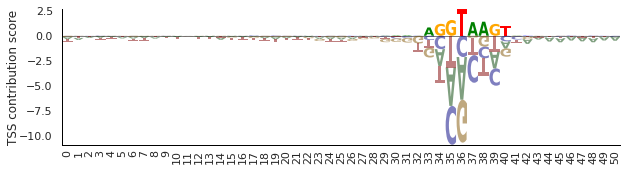

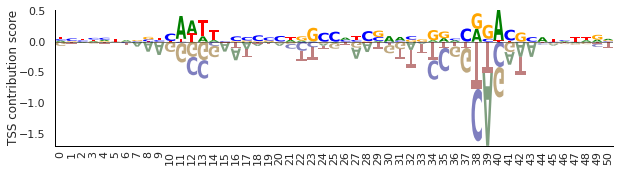

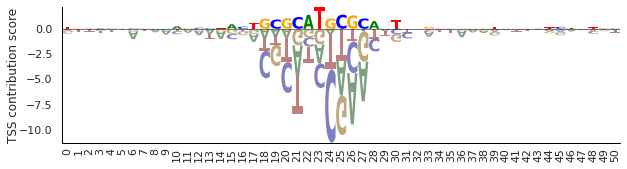

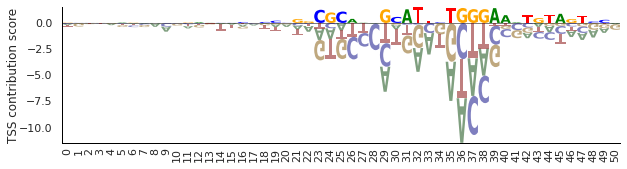

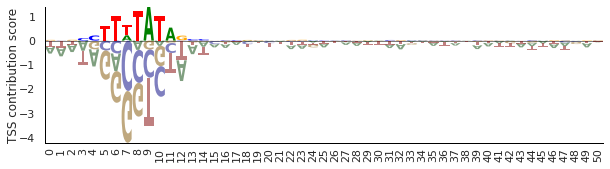

In [ ]:
for mat in selectmats:
    plotfun(mat.T)

In [ ]:
offsets = []
for i in range(len(selectmats)):
    offset = 25 - np.round((np.arange(51) * np.square((selectmats[i] - selectmats[i].mean(axis=0))).sum(axis=0)).sum()/  np.square((selectmats[i] - selectmats[i].mean(axis=0))).sum(axis=0).sum())
    offsets.append(offset)
print(offsets)

[12.0, -2.0, 8.0, 1.0, -16.0, -11.0, -8.0, 1.0, -9.0, 17.0]


In [ ]:
#with manual adjustment to centering offsets
for i, offset in zip(range(len(selectmats)), [12.0, -2.0, 8.0, 1.0, -16.0, -11.0, 0, 1.0, -9.0, 17.0]):
    print(offset)
    if offset > 0:
        selectmats[i][ :, int(offset):] = selectmats[i][:, :-int(offset)]
        selectmats[i][ :, :int(offset)] = 0
        selectdemats[i][ :, :,int(offset):] = selectdemats[i][:, :,:-int(offset)]
        selectdemats[i][ :, :,:int(offset)] = 0
        selectdemats_rc[i][ :, :, int(offset):] = selectdemats_rc[i][:, :, :-int(offset)]
        selectdemats_rc[i][ :, :,:int(offset)] = 0
    elif offset < 0:
        selectmats[i][:, :-int(np.abs(offset))] = selectmats[i][:, int(np.abs(offset)):]
        selectmats[i][:, -int(np.abs(offset)):] = 0
        selectdemats[i][:,:, :-int(np.abs(offset))] = selectdemats[i][:, :, int(np.abs(offset)):]
        selectdemats[i][:,:, -int(np.abs(offset)):] = 0
        selectdemats_rc[i][:,:, :-int(np.abs(offset))] = selectdemats_rc[i][:, :, int(np.abs(offset)):]
        selectdemats_rc[i][:,:, -int(np.abs(offset)):] = 0

12.0
-2.0
8.0
1.0
-16.0
-11.0
0
1.0
-9.0
17.0


In [ ]:
np.save(arr=np.stack(selectmats), file='stage2_40000_3.centered.npy')
np.save(arr=np.concatenate([np.concatenate(selectdemats, axis=1),
                np.concatenate(selectdemats_rc, axis=1)], axis=1),
        file='stage2_40000_3.centered.deconv.npy')


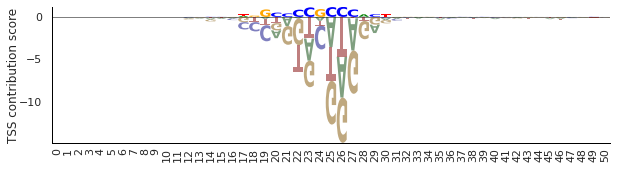

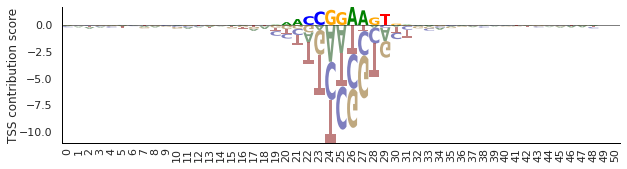

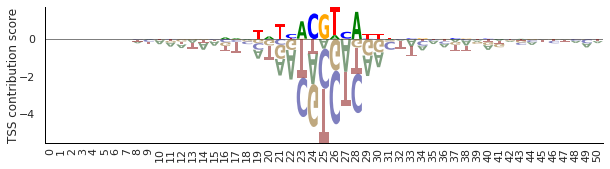

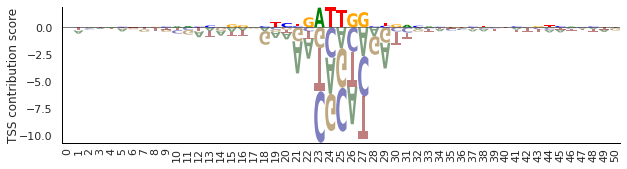

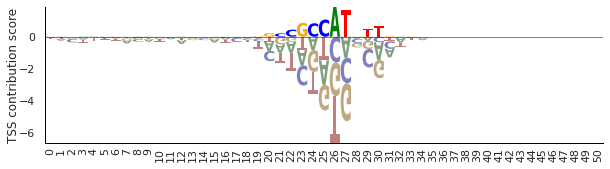

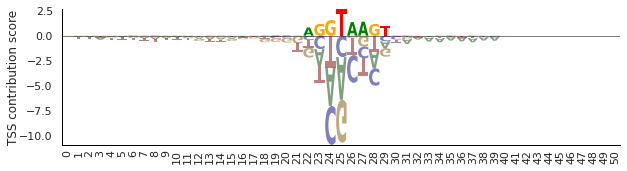

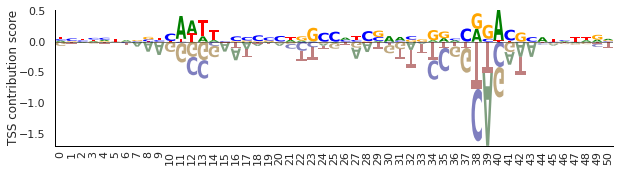

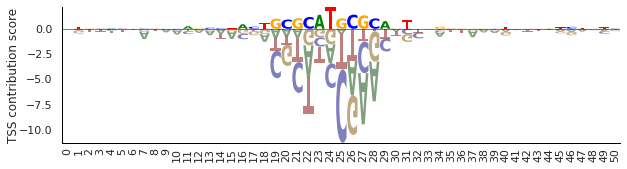

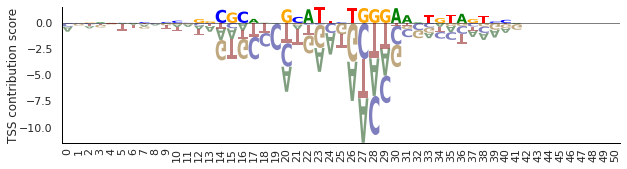

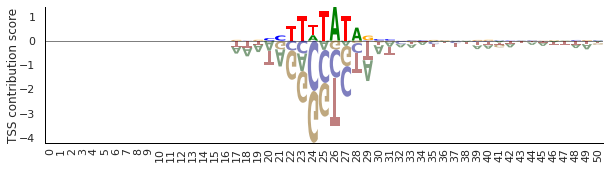

In [ ]:
for mat in selectmats:
    plotfun(mat.T)

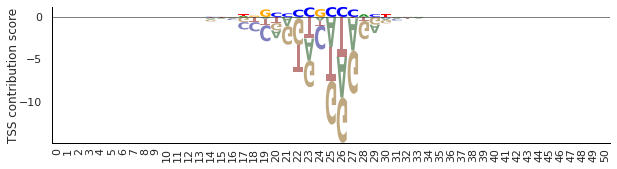

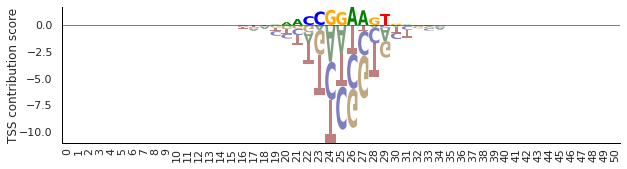

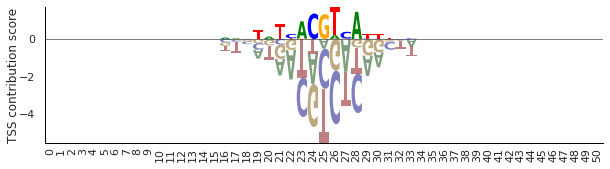

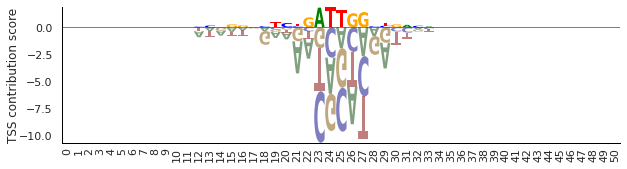

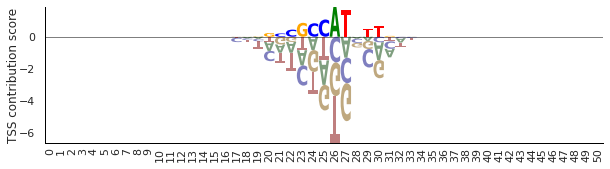

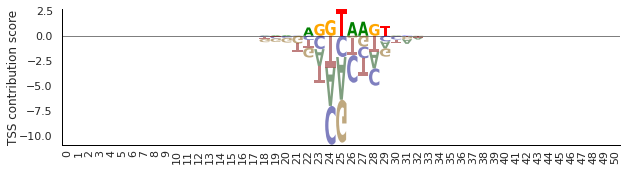

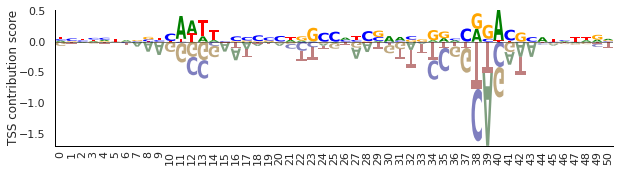

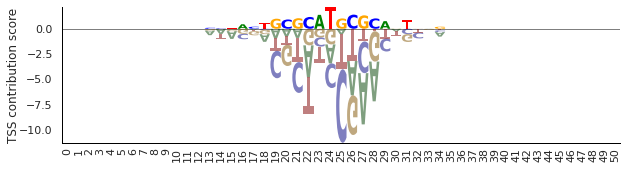

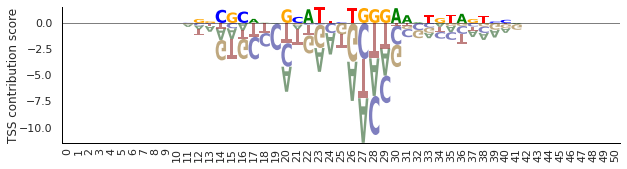

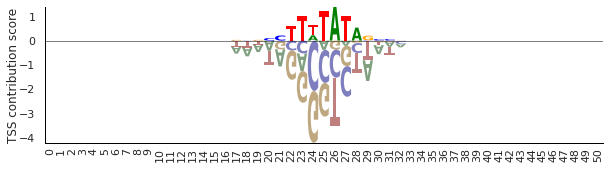

In [ ]:
cutoffs = [[14,34], [16,35],[16,34],[12,34],[17,34],[18,33],[0,51],[13,35], [11,42], [17,33]]

for m, (l,r) in zip(selectmats, cutoffs):
    m[:,:l]=0
    m[:,r:]=0
for mat in selectmats:
    plotfun(mat.T)

In [ ]:
np.save(arr=np.stack(selectmats), file='stage2_40000_3.centered.cut.npy')
